In [40]:
from sklearn.datasets import make_moons
from matplotlib import pyplot as plt
%matplotlib inline
import numpy as np
import sys
sys.setrecursionlimit(1000000)#
# from sklearn.cluster import DBSCAN
import time 

In [41]:
from sklearn.datasets import make_classification
from sklearn.cluster import AffinityPropagation
import pandas as pd
from scipy.spatial.distance import pdist, squareform
from sklearn.metrics.pairwise import haversine_distances
from math import sin, cos, sqrt, atan2, radians
import math
from sklearn.cluster import DBSCAN
from scipy.spatial import distance
import numpy
from scipy.cluster.vq import whiten
from scipy.cluster.vq import kmeans2
from sklearn.datasets import make_moons
from matplotlib import pyplot as plt
%matplotlib inline
import numpy as np
import sys
sys.setrecursionlimit(1000000)#

In [42]:
from sklearn.datasets import make_classification
from sklearn.cluster import AffinityPropagation
import pandas as pd
from scipy.spatial.distance import pdist, squareform
from sklearn.metrics.pairwise import haversine_distances
from math import sin, cos, sqrt, atan2, radians
import math
from sklearn.cluster import DBSCAN
from scipy.spatial import distance
import numpy
from scipy.cluster.vq import whiten
from scipy.cluster.vq import kmeans2
from sklearn.datasets import make_moons
from matplotlib import pyplot as plt
%matplotlib inline
import numpy as np
import sys
sys.setrecursionlimit(1000000)#

In [48]:
from sklearn.datasets import make_blobs
from sklearn.neighbors import KNeighborsClassifier
import numpy as np
from sklearn.model_selection import train_test_split
from matplotlib.colors import ListedColormap
from mpl_toolkits.basemap import Basemap
import matplotlib.pyplot as plt
import numpy as np
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import StandardScaler
from sklearn.metrics import calinski_harabasz_score
from sklearn.metrics import fowlkes_mallows_score
from sklearn.metrics import f1_score
import sklearn.metrics as metrics
from sklearn.metrics import accuracy_score
from numpy import unique
from numpy import where
from sklearn.datasets import make_classification
from sklearn.cluster import DBSCAN
from matplotlib import pyplot


In [44]:

dat = np.load("20220220_SSS_ALL.npz")  
Latitude = dat["lat"]
Longitude = dat["lng"]
# distance_matrix = dat["distance_matrix"]
# cog = dat["cog"]
print(dat.files)

['lat', 'lng', 'cog']


In [22]:
batsize = len(Latitude)
print(batsize)
X = np.zeros([len(Latitude),2],dtype=float)
j = 0
for i in range(batsize):
    if(Latitude[i]>0 and Latitude[i] < 90) and (Longitude[i]>0 and  Longitude[i] < 180):
        X[j][0]=Longitude[i]
        X[j][1]=Latitude[i]
        j += 1
print(j)


420869
15411


In [23]:
Longitude = X[0:j,0]
Latitude = X[0:j,1]

In [24]:
X = np.zeros([j,2],dtype=float)
# Latitude = dat["lat"]
# Longitude = dat["lng"]
X[:,0]=Longitude
X[:,1]=Latitude

In [45]:
X = np.zeros([len(Latitude),2],dtype=float)
# Latitude = dat["lat"]
# Longitude = dat["lng"]
X[:,0]=Longitude
X[:,1]=Latitude

In [46]:
X.shape

(420869, 2)

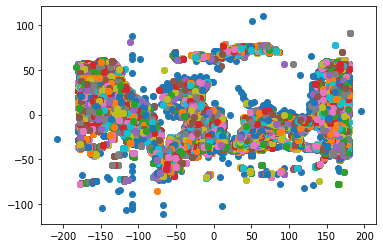

In [47]:
from numpy import unique
from numpy import where
from sklearn.datasets import make_classification
from sklearn.cluster import DBSCAN
from matplotlib import pyplot

model = DBSCAN(eps=0.1, min_samples=2)  # using "precomputed" as recommended

yhat = model.fit_predict(X)

clusters = unique(yhat)



for cluster in clusters:
    row_ix = where(yhat == cluster)
    pyplot.scatter(X[row_ix, 0], X[row_ix, 1])
pyplot.show()



In [ ]:
for eps in numpy.arange(0.1,3,0.05):
    for min_samples in range(2,14,2):
        model = DBSCAN(eps=eps, min_samples=min_samples)  # using "precomputed" as recommended
        yhat = model.fit_predict(X)
        clusters = unique(yhat)
        print("clusters:",len(clusters))
        fig=plt.figure()
                    # plot coastlines with basemap
        m = Basemap(projection='cyl', resolution='c',
                             llcrnrlat=-90, urcrnrlat=90,
                             llcrnrlon=-180, urcrnrlon=180
                           )
        m.drawmapboundary(fill_color='#DDEEFF')
        m.fillcontinents(color='#FFEEDD')
        m.drawcoastlines(color='gray', zorder=2)
        m.drawcountries(color='gray', zorder=2)
                    # m.drawparallels(np.arange(-90.,90.1,15.))
                    # m.drawmeridians(np.arange(0.,360.,60.))
        m.drawparallels(np.arange(-90,90,10),labels=[1,0,0,0],linewidth=.4)
        m.drawmeridians(np.arange(-180,180,10),labels=[0,0,0,1],linewidth=.4)

        for cluster in clusters:
            row_ix = where(yhat == cluster)
            m.scatter(X[row_ix, 0], X[row_ix, 1],  zorder=3,cmap='rainbow', latlon=True, marker='.',s=0.5);
        plt.savefig('实验3DBSCAN/'+'eps_'+str(eps)+'_min_samples_'+str(min_samples)+'.png', dpi=800,format='png',bbox_inches='tight')    
#         plt.show()
        plt.close()

clusters: 14138
clusters: 10808
clusters: 9100
clusters: 7937
clusters: 7084
clusters: 6367
clusters: 12388
clusters: 9530
clusters: 8033
clusters: 7052
clusters: 6330
clusters: 5682
clusters: 10939
clusters: 8443
clusters: 7137
clusters: 6291
clusters: 5661
clusters: 5107


In [28]:
import folium 

In [33]:
# tiles = 'https://webst02.is.autonavi.com/appmaptile?style=6&x={x}&y={y}&z={z}'
AISMap=folium.Map(location=[-25, 140],
                 zoom_start=4,
#                   max_zoom=18
               )

In [34]:
def draw_Circle(map, loc, radius, colort): #        color="#ff6633",
    folium.CircleMarker(
        location=loc,
        radius=radius,
        color=colort,
#         weight=0.1,
        fill=True,
#         fill_opacity=1,
#         opacity=0.1,
    ).add_to(map)


In [35]:
for lat,lng,in zip(Latitude,Longitude):
    draw_Circle(AISMap,[lat,lng],0.01,'#7392f7')  #

In [36]:
AISMap

In [52]:
AISMap.save('Map.html')